In [1]:
import sys
sys.path.append("../SpikeCounter")
import numpy as np
import skimage.io as skio
import scipy.ndimage as ndi
import scipy.signal as signal
import scipy.stats as stats
import scipy.fft as fft
import skimage.morphology as morphology
from skimage.measure import label
import matplotlib.pyplot as plt
import skimage.transform as transform
from tifffile import imsave
import scipy.ndimage as ndimage
import matplotlib.colors as colors
import matplotlib.patches as patches
import colorcet as cc
from cycler import cycler
import os
from scipy import interpolate, optimize
import skimage.filters as filters
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import time
import mat73
import pandas as pd
import parse
import traceback


from spikecounter.analysis import traces, images
from spikecounter.ui import visualize, HyperStackViewer
from spikecounter import utils

plt.style.use("../bio_pubs_presentation.mplstyle")
ss = StandardScaler()

In [2]:
rootdir = "/n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/"

Identify videos with successfully denoised data

In [3]:
expt_info = pd.read_csv(os.path.join(rootdir,"analysis/experiment_data.csv")).sort_values("start_time").reset_index()

In [4]:
denoised_experiments = sorted([parse.parse("{}.tif", f)[0] for f in \
                        os.listdir(os.path.join(rootdir,"denoised"))])

## Load image

In [24]:
def image_to_sta(raw_img, fs=1, mask=None, plot=False, \
                 savedir=None, prom_pct=90, sta_bounds="auto", \
                 exclude_pks = None, offset=0, abs_prom=None, full_output=False):
    """ Convert raw image into spike triggered average
    """
    if savedir is not None:
        os.makedirs(savedir, exist_ok=True)

    if plot:
        fig1, axes = plt.subplots(2,2, figsize=(10,10))
        axes = axes.ravel()

    # Generate mask if not provided
    mean_img = raw_img.mean(axis=0)
    if mask is None:
        mask = mean_img > np.percentile(mean_img, 80)
        kernel_size = int(mask.shape[0]/50)
        mask = morphology.binary_closing(mask, footprint=np.ones((kernel_size, kernel_size)))
    _ = visualize.display_roi_overlay(mean_img, mask.astype(int), ax=axes[0])
    
    raw_trace = images.extract_mask_trace(raw_img, np.tile(mask, (raw_img.shape[0], 1, 1)))
    
    # convert to DF/F
    
    dFF_img = images.get_image_dFF(raw_img)
    
    if savedir:
        skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)
    print(dFF_img.shape)
    print(fs)
    dFF_mean = images.extract_mask_trace(dFF_img, mask=np.tile(mask, (dFF_img.shape[0], 1, 1)))

    # Identify spikes
    if abs_prom is None:
        ps = np.percentile(dFF_mean,[10,prom_pct])
        prominence = ps[1] - ps[0]
        pks, _ = signal.find_peaks(dFF_mean, prominence=prominence)
    else:
        pks, _ = signal.find_peaks(dFF_mean, prominence=abs_prom)
    
    if exclude_pks:
        keep = np.ones(len(pks))
        keep[exclude_pks] = 0
        pks = pks[keep]

    if plot:
        axes[1].plot(np.arange(dFF_img.shape[0])/fs, dFF_mean)
        axes[1].plot(pks/fs, dFF_mean[pks], "rx")
        axes[1].set_xlabel("Time (s)")
        axes[1].set_ylabel(r"$F/F_0$")
        tx = axes[1].twinx()
        tx.plot(np.arange(dFF_img.shape[0])/fs, raw_trace, color="C1")
        tx.set_ylabel("Mean counts")

    # Automatically determine bounds for spike-triggered average
    if sta_bounds == "auto":
        try:
        # Align all detected peaks of the full trace and take the mean
            aligned_traces = traces.align_fixed_offset(np.tile(dFF_mean, (len(pks), 1)), pks)
        except Exception as e:
            print(e)
            return raw_trace
        mean_trace = np.nanmean(aligned_traces, axis=0)
        # Smooth
        spl = interpolate.UnivariateSpline(np.arange(len(mean_trace)), \
                                np.nan_to_num(mean_trace, nan=np.nanmin(mean_trace)), s=0.001)
        smoothed = spl(np.arange(len(mean_trace)))
        smoothed_dfdt = spl.derivative()(np.arange(len(mean_trace)))   
        # Find the first minimum before and the first minimum after the real spike-triggered peak
        if plot:
            axes[3].plot(mean_trace)
            axes[3].plot(smoothed, color="C1")
            tx = axes[3].twinx()
            tx.plot(smoothed_dfdt, color="C2")
            tx.ticklabel_format(axis='y', style='sci', scilimits=(0,0))
        try:
            minima_left = np.argwhere((smoothed_dfdt < 0)).ravel()
            minima_right = np.argwhere((smoothed_dfdt > 0)).ravel()
            # calculate number of samples to take before and after the peak
            b1 = pks[-1] - minima_left[minima_left<pks[-1]][-1]+offset
            b2 = minima_right[minima_right > pks[-1]][0] - pks[-1]+offset
        except Exception:
            return mean_trace
        
        if plot:
            axes[3].plot([pks[-1]-b1, pks[-1], pks[-1]+b2], mean_trace[[pks[-1]-b1, pks[-1], pks[-1]+b2]], "rx")
    else:
        b1,b2 = sta_bounds


    # Collect spike traces according to bounds
    spike_traces = np.nan*np.ones((len(pks), b1+b2))
    spike_images = np.nan*np.ones((len(pks), b1+b2, dFF_img.shape[1], dFF_img.shape[2]))
    print(b1,b2)
    for idx, pk in enumerate(pks):
        n_prepend = max(0, b1-pk)
        n_append = max(0, pk+b2-len(dFF_mean))

        mean_block = np.concatenate([np.ones(n_prepend)*np.nan, dFF_mean[max(0, pk-b1):min(len(dFF_mean), pk+b2)], np.ones(n_append)*np.nan])
        img_block = np.concatenate([np.ones((n_prepend, dFF_img.shape[1], dFF_img.shape[2]))*np.nan, \
                                    dFF_img[max(0, pk-b1):min(len(dFF_mean), pk+b2),:,:], np.ones((n_append, dFF_img.shape[1], dFF_img.shape[2]))*np.nan])
        
        spike_traces[idx,:] = mean_block
        spike_images[idx,:,:] = img_block
    
    sta_trace = np.nanmean(spike_traces, axis=0)
    sta = np.nanmean(spike_images, axis=0)

    if plot:
        axes[2].plot(np.arange(b1+b2)/fs, sta_trace)
        axes[2].set_xlabel("Time (s)")
        axes[2].set_ylabel(r"$F/F_0$")
        axes[2].set_title("STA taps: %d + %d" % (b1,b2))
        plt.tight_layout()
    if savedir:
        skio.imsave(os.path.join(savedir, "sta.tif"), sta)
        if plot:
            plt.savefig(os.path.join(savedir, "QA_plots.tif"))
    if full_output:
        return sta, spike_images
    return sta

In [15]:
filename = denoised_experiments[0]
print(filename)
img, expt_data = images.load_image(rootdir, filename, subfolder="corrected")
print(img.shape)

110213E1
(580, 216, 216)


In [18]:
dt_dict, t = utils.traces_to_dict(expt_data)
dt = np.mean(np.diff(t))

/tmp/ipykernel_187012/2170565939.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/110213E1/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(580, 216, 216)
9.690470744899155


/tmp/ipykernel_187012/2170565939.py:60: RuntimeWarning: Mean of empty slice
  mean_trace = np.nanmean(aligned_traces, axis=0)


138 121


/tmp/ipykernel_187012/2170565939.py:112: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/110213E1/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)


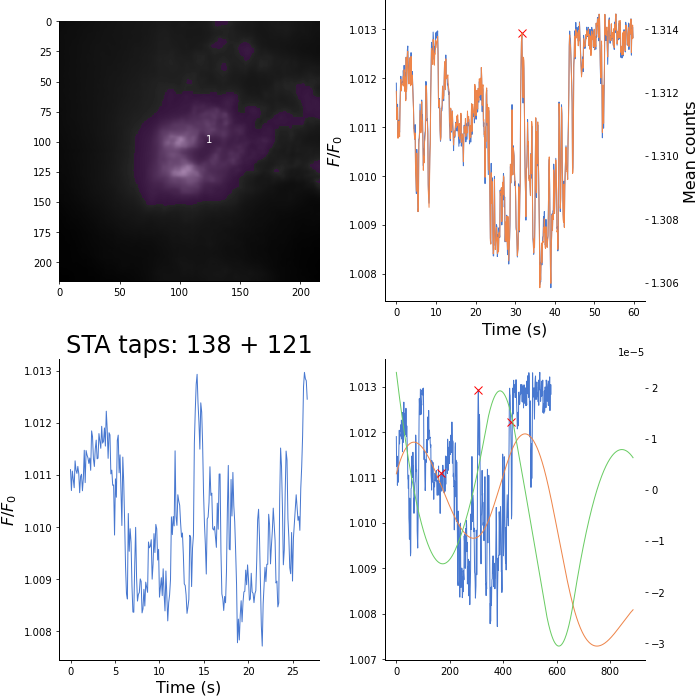

In [19]:
sta, spike_images = image_to_sta(img, fs=1/dt, plot=True, prom_pct=90, \
                   savedir=os.path.join(rootdir, "analysis", filename), offset=120, full_output=True)

In [46]:
utils.display_zstack(sta[:,:,:, np.newaxis], c=0, pct_cutoffs=[5,99])

interactive(children=(IntSlider(value=357, description='z', max=715), Dropdown(description='c', options=('all'…

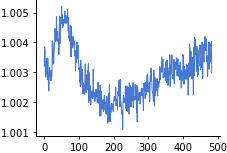

In [53]:
test_mask = np.zeros((sta.shape[1], sta.shape[2]), dtype=bool)
test_mask[0:5,170:175] = True
test_trace = images.extract_mask_trace(sta, mask=test_mask)
plt.plot(test_trace)

In [22]:
downsampled_img, _ = images.load_image(rootdir, filename, subfolder="downsampled")

/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:37: UserWarning: 203 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


(0.0, 0.02)

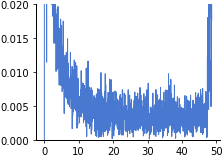

In [48]:
test_mask = np.zeros((sta.shape[1], sta.shape[2]), dtype=bool)
test_mask[100:110,:] = True
downsampled_trace = images.extract_mask_trace(downsampled_img, mask=test_mask)
N = len(downsampled_trace)
yf = fft.fft(downsampled_trace-np.mean(downsampled_trace))
xf = fft.fftfreq(N, dt)[:N//2]
plt.plot(xf, 2.0/N*np.abs(yf[0:N//2]))
plt.ylim(0, 0.02)

In [59]:
beta, smoothed_vid = images.spline_timing(sta, s=0.05, n_knots=15)

/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


In [60]:
utils.display_zstack(smoothed_vid[:,:,:, np.newaxis], c=0, pct_cutoffs=[5,99])

interactive(children=(IntSlider(value=281, description='z', max=563), Dropdown(description='c', options=('all'…

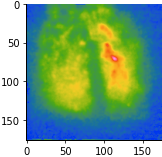

In [65]:
plt.imshow(beta[2,:,:])

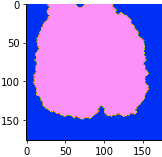

In [70]:
amplitude = beta[2,:,:]
amplitude_nan_removed = np.copy(amplitude)
minval = np.nanmin(amplitude)
amplitude_nan_removed[np.isnan(amplitude)] = minval
thresh = np.percentile(amplitude_nan_removed,40)
# thresh = filters.threshold_otsu(amplitude_nan_removed)
mask = amplitude_nan_removed>thresh
mask = morphology.binary_opening(mask, footprint=morphology.disk(2))
mask = morphology.binary_closing(mask, footprint=morphology.disk(2))
plt.imshow(mask)

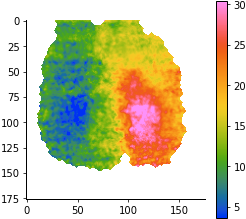

In [71]:
fig1, ax1 = plt.subplots(figsize=(4,4))
hm = beta[1,:,:]
hm_nan = np.copy(hm)
hm_nan[~mask] = np.nan
hm_nan = hm_nan-np.nanmin(hm_nan)
im = ax1.imshow(hm_nan, vmin=np.percentile(hm_nan[~np.isnan(hm_nan)],1), \
               vmax=np.percentile(hm_nan[~np.isnan(hm_nan)],99))
plt.colorbar(im, ax=ax1)

In [73]:
spike_images.shape

(3, 564, 176, 176)

In [9]:
betas_individual = []
smoothed_vids_individual = []

In [10]:
for i in range(spike_images.shape[0]):
    b, sv = images.spline_timing(spike_images[i,:,:,:], s=0.05, n_knots=15)
    betas_individual.append(b)
    smoothed_vids_individual.append(sv)

/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


In [6]:
del expt_info["index"]

/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 56 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


114644E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/114644E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1180, 216, 216)
38.68033350903914
60 60


/tmp/ipykernel_187012/1197375243.py:106: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_187012/1197375243.py:107: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

(24, '11:46:44', '114644E1_fast', 0.0)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 56 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


115153E2_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/115153E2_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1180, 216, 216)
38.68086656416499
60 60


/tmp/ipykernel_187012/1197375243.py:106: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_187012/1197375243.py:107: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

(0, '11:51:53', '115153E2_fast', 0.0)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 57 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


115822E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/115822E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1180, 216, 216)
38.681995502748585
60 60


/tmp/ipykernel_187012/1197375243.py:116: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/115822E3_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating t

(30, '11:58:22', '115822E3_fast', 0.22946946484681363)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 56 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


120027E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/120027E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1180, 216, 216)
38.67984892621921
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(7, '12:00:27', '120027E1_fast', 0.09833859896496408)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 56 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


120351E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/120351E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1180, 216, 216)
38.68075752896672
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(23, '12:03:51', '120351E3_fast', 0.16390151495324884)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


120824E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/120824E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34709269686655
60 60


/tmp/ipykernel_187012/1197375243.py:106: RuntimeWarning: Mean of empty slice
  sta_trace = np.nanmean(spike_traces, axis=0)
/tmp/ipykernel_187012/1197375243.py:107: RuntimeWarning: Mean of empty slice
  sta = np.nanmean(spike_images, axis=0)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creati

(28, '12:08:24', '120824E1_fast', 0.0)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


121107E3_fast
(1480, 216, 216)
48.34576137533521
60 60


/tmp/ipykernel_187012/1197375243.py:116: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/121107E3_fast/sta.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "sta.tif"), sta)
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating t

(34, '12:11:07', '121107E3_fast', 0.3919926598000152)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


121401E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/121401E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34721372973251
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(12, '12:14:01', '121401E1_fast', 0.09800110891161995)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


121646E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/121646E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34768273781193
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))
/tmp/ipykernel_187012/3016389602.py:30: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/121646E3_fast/individ

(21, '12:16:46', '121646E3_fast', 0.19600411920734565)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


122416E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/122416E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34679011735283
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(2, '12:24:16', '122416E1_fast', 0.032666750079292456)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


122734E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/122734E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34716834233675
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(19, '12:27:34', '122734E3_fast', 0.09800101691014206)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


123021E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/123021E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.3457916318285
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(14, '12:30:21', '123021E1_fast', 0.0653321508538223)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


123235E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/123235E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34709269686655
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(36, '12:32:35', '123235E3_fast', 0.16333477262454915)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


123526E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/123526E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34691114870384
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(11, '12:35:26', '123526E1_fast', 0.03266683185723232)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


123838E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/123838E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.34763734953558
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(41, '12:38:38', '123838E3_fast', 0.13066929013387993)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


124248E1_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/124248E1_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.346578313946715
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(6, '12:42:48', '124248E1_fast', 0.06533321393776582)


/n/home11/bjia/notebooks/../SpikeCounter/spikecounter/analysis/images.py:64: UserWarning: 66 frames dropped
  warnings.warn("%d frames dropped" % (fc_max - img.shape[0]))


124554E3_fast


/tmp/ipykernel_187012/1197375243.py:28: UserWarning: /n/holyscratch01/cohen_lab/bjia/20220203_gcamp_site_of_initiation/analysis/corrected/124554E3_fast/dFF.tif is a low contrast image
  skio.imsave(os.path.join(savedir, "dFF.tif"), dFF_img)


(1480, 216, 216)
48.3474255387061
60 60


/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:379: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  res = asanyarray(func1d(inarr_view[ind0], *args, **kwargs))
/n/home11/bjia/.conda/envs/bjia2/lib/python3.9/site-packages/numpy/lib/shape_base.py:402: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  buff[ind] = asanyarray(func1d(inarr_view[ind], *args, **kwargs))


(31, '12:45:54', '124554E3_fast', 0.13066871767217864)


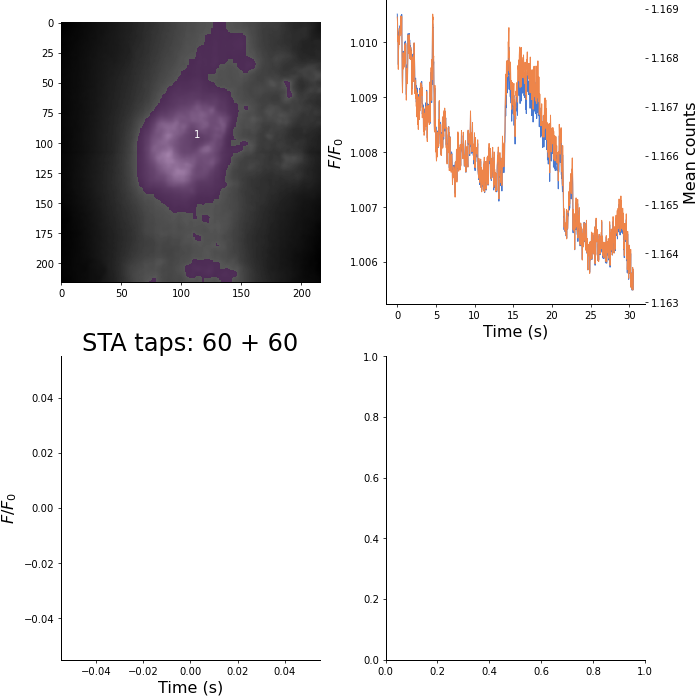

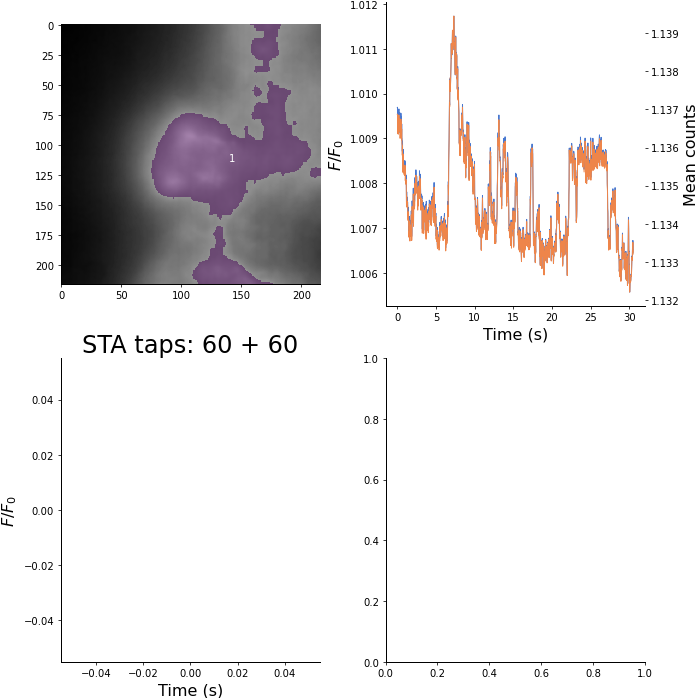

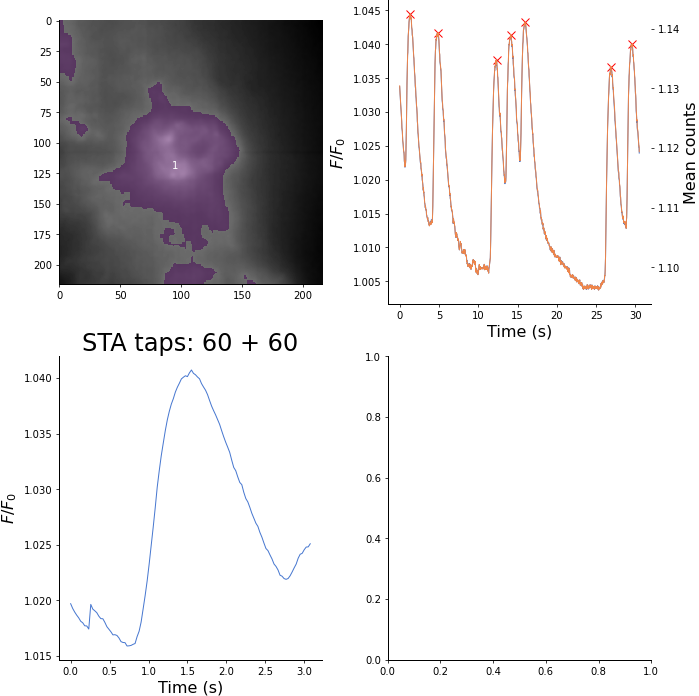

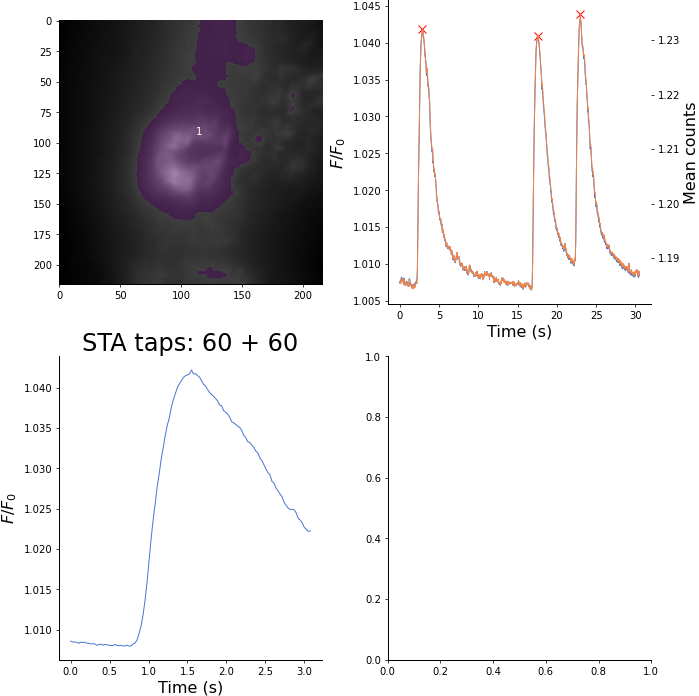

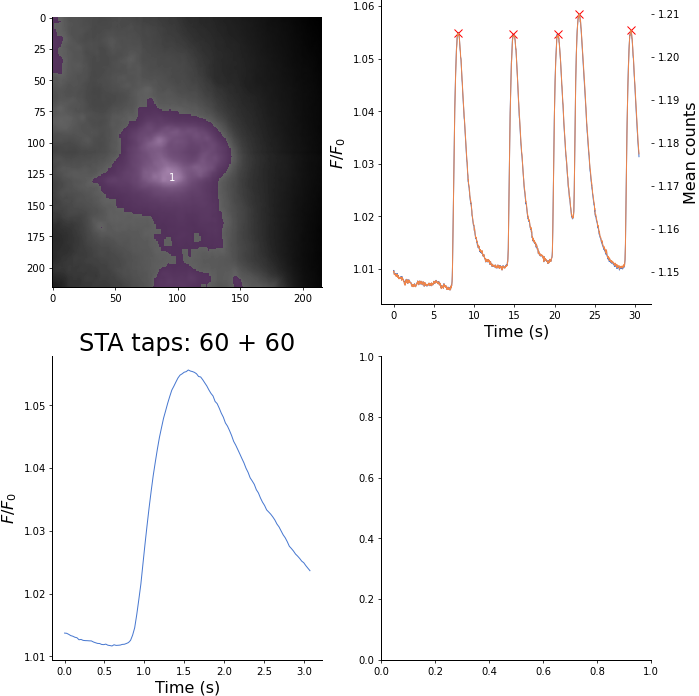

...

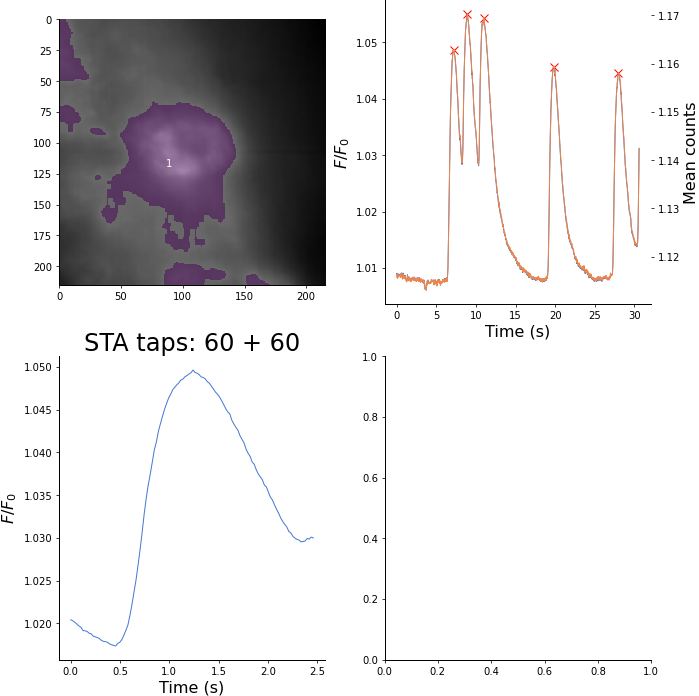

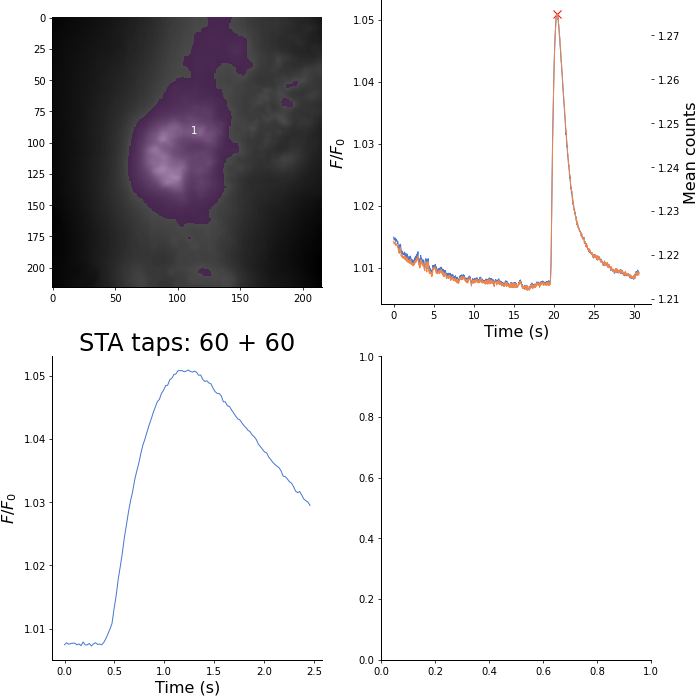

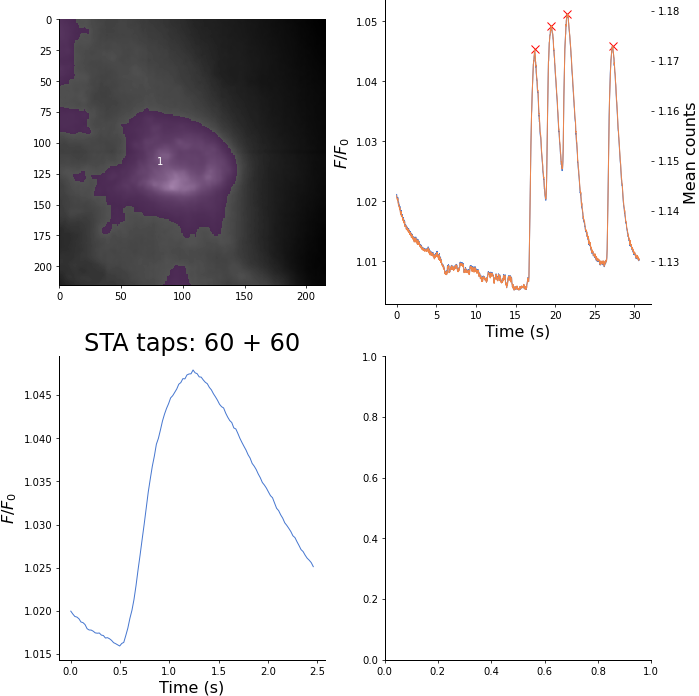

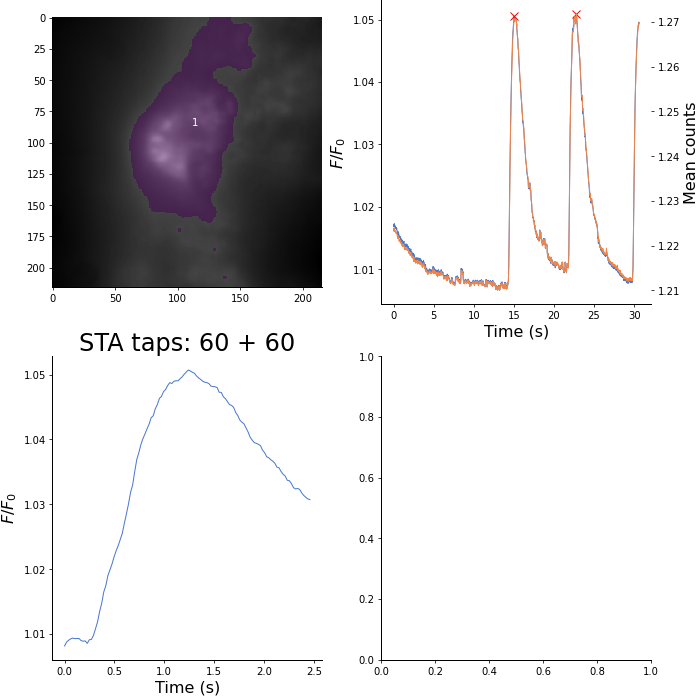

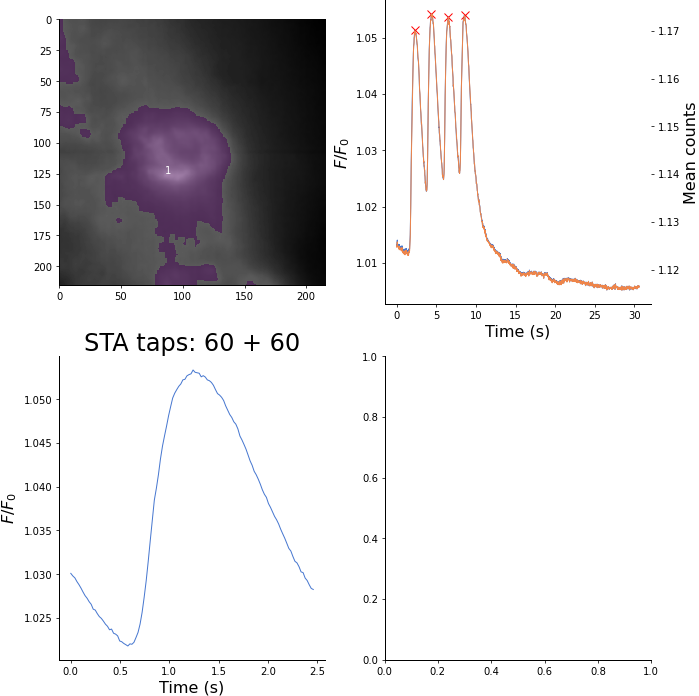

In [26]:
%matplotlib inline
subfolder = "corrected"
data = []
os.makedirs(os.path.join(rootdir, "analysis", subfolder), exist_ok=True)
for i in range(expt_info.shape[0]):
    f = expt_info.iloc[i]["file_name"]
    if f in denoised_experiments and "fast" in f:
        filename, _ = os.path.splitext(f)
        os.makedirs(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes"), exist_ok=True)
        img, expt_data = images.load_image(rootdir, filename, subfolder=subfolder)
        expt_dict, t = utils.traces_to_dict(expt_data)
        dt = np.mean(np.diff(t))
        print(filename)
        try:
            sta, spike_images = image_to_sta(img, fs=1/dt, plot=True, prom_pct=90,abs_prom=0.01, \
                               savedir=os.path.join(rootdir, "analysis", subfolder, filename), \
                                offset=120, sta_bounds=(60, 60), full_output=True)
            freq = spike_images.shape[0]/(img.shape[0]*dt)
            
            beta, smoothed_vid = images.spline_timing(sta, s=0.05, n_knots=15)
            skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "spline_smoothed_vid.tif"), smoothed_vid)
            np.savez(os.path.join(rootdir, "analysis", subfolder, "%s_snapt.npz") % filename,\
                     beta=beta)
            betas_individual = []
            smoothed_vids_individual = []
            for j in range(spike_images.shape[0]):
                b, sv = images.spline_timing(spike_images[j,:,:,:], s=0.05, n_knots=15)
                np.savez(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes", "spike%d.npz" % j),\
                     beta=b)
                skio.imsave(os.path.join(rootdir, "analysis", subfolder, filename, "individual_spikes", "spike%d.tif" % j), sv)
            print(tuple(expt_info.iloc[i]) + (freq,))
            data.append(tuple(expt_info.iloc[i]) + (freq,))
        except Exception as e:
            traceback.print_exc()
            continue
data = pd.DataFrame(data, columns = expt_info.columns.tolist() + ['freq'])
data.to_csv(os.path.join(rootdir, "analysis", subfolder, "experiment_data.csv"), index=False)

In [29]:
del data["index"]

In [30]:
data.to_csv(os.path.join(rootdir, "analysis", subfolder, "experiment_data.csv"), index=False)

Manually draw ROIs on the fit images

In [19]:
files = []
files_by_embryo = {}
masks = []
masks_by_embryo = {}
control_points_by_embryo = {}
for f in sorted(os.listdir(os.path.join(rootdir, "analysis"))):
    if "snapt_denoised.npz" in f:
        files.append(os.path.join(rootdir, "analysis", f))
        res = parse.search("E{:d}_gcamp", f)
        if res is not None:
            res = res[0]
            if res not in files_by_embryo.keys():
                files_by_embryo[res] = [os.path.join(rootdir, "analysis", f)]
                masks_by_embryo[res] = []
                control_points_by_embryo[res] = []
            else:
                files_by_embryo[res].append(os.path.join(rootdir, "analysis", f))
print(len(files))

21


In [31]:
os.listdir(os.path.join(rootdir, "analysis"))

['110902E6_gcamp_fast_snapt_denoised.npz',
 '111428E15_gcamp_fast_snapt_denoised.npz',
 '111750E18_gcamp_fast',
 '091430E14_gcamp_fast_snapt_denoised.npz',
 '111608E17_gcamp_fast',
 '111428E15_gcamp_fast',
 '105802E15_gcamp_fast',
 '111238E14_gcamp_fast',
 '110222E18_gcamp_fast_snapt_denoised.npz',
 '103436E16_gcamp_fast_snapt_denoised.npz',
 '104310E2_gcamp_fast_snapt_denoised.npz',
 '095009E14_gcamp_fast',
 '105603E14_gcamp_fast',
 '104720E6_gcamp_fast',
 '111608E17_gcamp_fast_snapt_denoised.npz',
 '093930E14_gcamp_fast_snapt_denoised.npz',
 '093930E14_gcamp_fast',
 '103753E18_gcamp_fast_snapt_denoised.npz',
 '091430E14_gcamp_fast',
 '102308E12_gcamp_fast',
 '095534E14_gcamp_fast',
 '103436E16_gcamp_fast',
 '100301E18_gcamp_fast_snapt_denoised.npz',
 '102556E14_gcamp_fast',
 '101424E6_gcamp_fast_snapt_denoised.npz',
 '105326E12_gcamp_fast_snapt_denoised.npz',
 '100301E18_gcamp_fast',
 '110512E1_gcamp_fast',
 '101424E6_gcamp_fast_snapt',
 '104140E1_gcamp_fast_snapt_denoised.npz',
 '11

In [28]:
denoised_experiments

['091430E14_gcamp_fast',
 '093930E14_gcamp_fast',
 '095534E14_gcamp_fast',
 '100301E18_gcamp_fast',
 '100807E2_gcamp_fast',
 '101424E6_gcamp_fast',
 '102308E12_gcamp_fast',
 '102556E14_gcamp_fast',
 '103436E16_gcamp_fast',
 '103753E18_gcamp_fast',
 '104140E1_gcamp_fast',
 '104310E2_gcamp_fast',
 '104720E6_gcamp_fast',
 '105326E12_gcamp_fast',
 '105603E14_gcamp_fast',
 '105802E15_gcamp_fast',
 '110028E17_gcamp_fast',
 '110222E18_gcamp_fast',
 '110512E1_gcamp_fast',
 '110705E2_gcamp_fast',
 '110902E6_gcamp_fast',
 '111108E12_gcamp_fast',
 '111238E14_gcamp_fast',
 '111428E15_gcamp_fast',
 '111608E17_gcamp_fast']

In [27]:
files_by_embryo

{14: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/091430E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/093930E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/095534E14_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/102556E14_gcamp_fast_snapt_denoised.npz'],
 18: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/103753E18_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110222E18_gcamp_fast_snapt_denoised.npz'],
 6: ['/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/101424E6_gcamp_fast_snapt_denoised.npz',
  '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110902E6_gcamp_fast_snapt_denoi

In [24]:
%matplotlib notebook
plt.close("all")
idx = 4
beta = np.load(files[idx])["beta"]
print(beta.shape)
amplitude = beta[2,:,:]
amplitude[np.isnan(amplitude)] = 0
p5, p95 = np.percentile(amplitude,[5,95])
amplitude[amplitude > p95] = p95
amplitude[amplitude < p5] = p5
#         mask = np.ones_like(amplitude, dtype=bool)
#         mask = amplitude > np.percentile(amplitude, 80)
#         mask = morphology.binary_opening(mask, np.ones((3,3)))
#         mask = morphology.binary_dilation(mask, np.ones((20,20)))
#         hm_time = beta[1,:,:]/fs
#         hm_time[~mask] = np.nan
h = HyperStackViewer(amplitude, width=6, height=6)
mask = h.select_region_clicky()


(4,)


IndexError: too many indices for array: array is 1-dimensional, but 3 were indexed

In [70]:
new_mask = h._points_to_mask(h.points, propagate_z=True).squeeze()
masks.append(new_mask)
print(len(masks))
res = parse.search("E{:d}_gcamp", files[idx])[0]
masks_by_embryo[res].append(new_mask)

26


In [72]:
masks = np.array(masks)

In [73]:
np.savez(os.path.join(rootdir, "analysis", "timeorder_masks.npz"), masks)

In [74]:
# f = open(os.path.join(rootdir, "analysis", "embryo_masks.pickle"), "wb")
# pickle.dump(masks_by_embryo, f)
# f.close()

In [83]:
f = open(os.path.join(rootdir, "analysis", "embryo_masks.pickle"), "rb")
masks_by_embryo = pickle.load(f)
f.close()

Show fit images.

Bad images:
* 093930E14_gcamp_fast
* 095009E14_gcamp_fast

In [11]:
!ls {os.path.join(rootdir, "analysis", "091430E14_gcamp_fast")}

dFF_mean.npz  dFF.tif  pca.tif	QA_plots.tif  sta.tif


In [ ]:
fi

/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/091430E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/093930E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/095534E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/102556E14_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/103753E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110222E18_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/101424E6_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/110902E6_gcamp_fast_snapt_denoised.npz
/n/holyscratch01/cohen_lab/bjia/20210921_25x_gca

/tmp/ipykernel_161788/3929352349.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, axes = plt.subplots(2,2,figsize=(10,10))


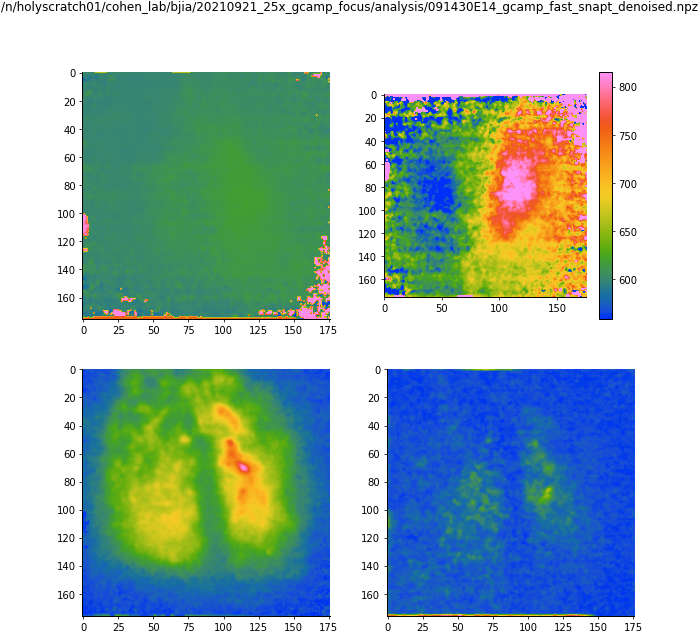

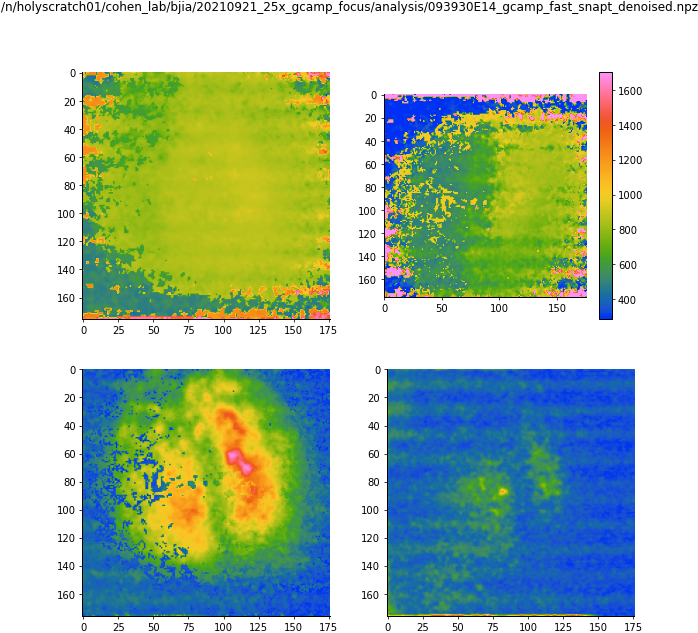

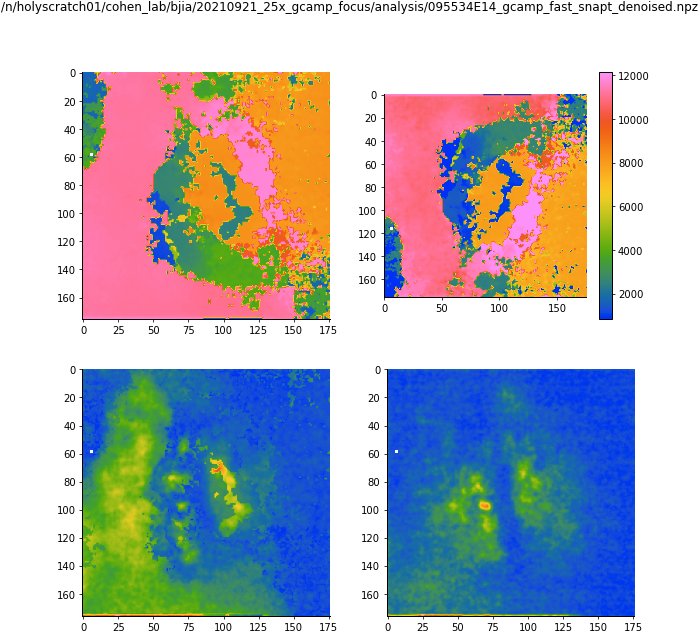

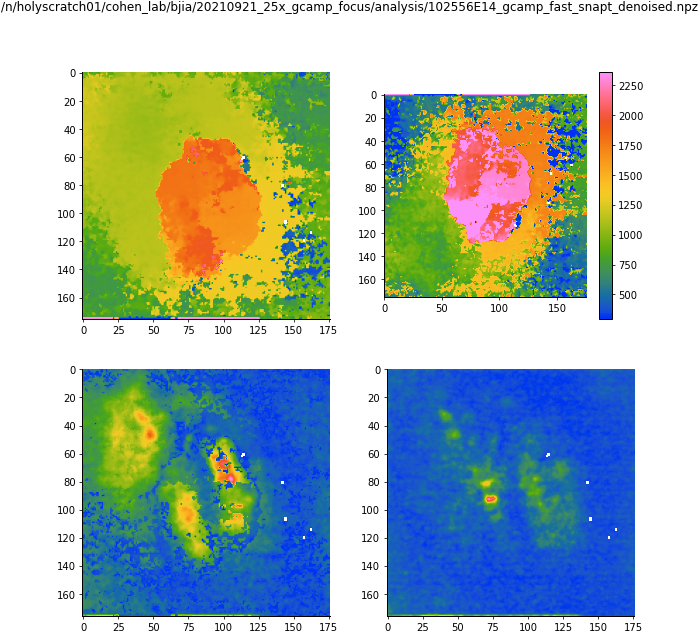

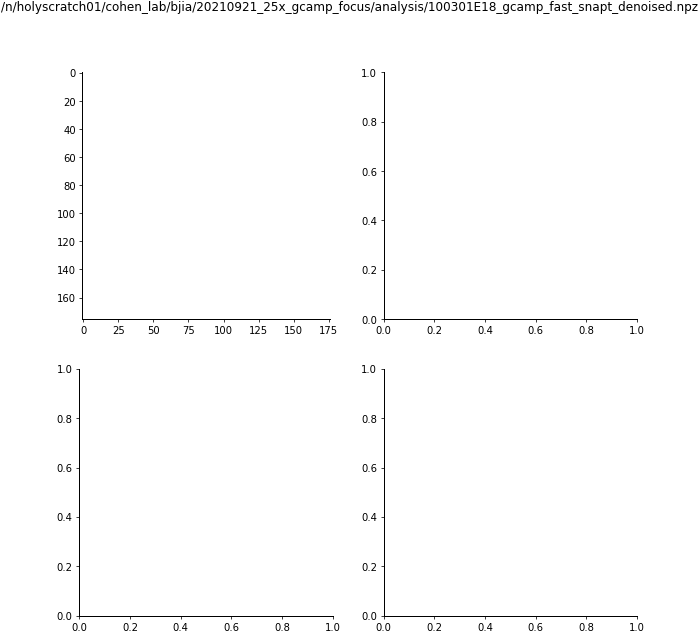

...

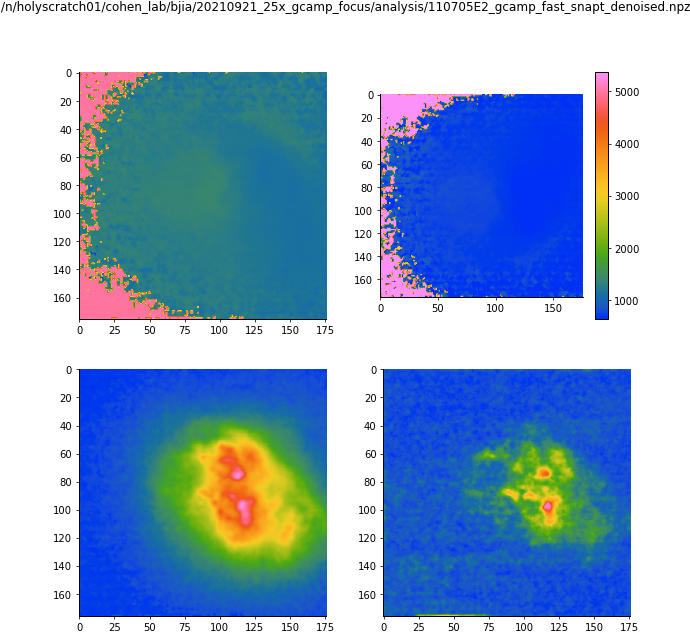

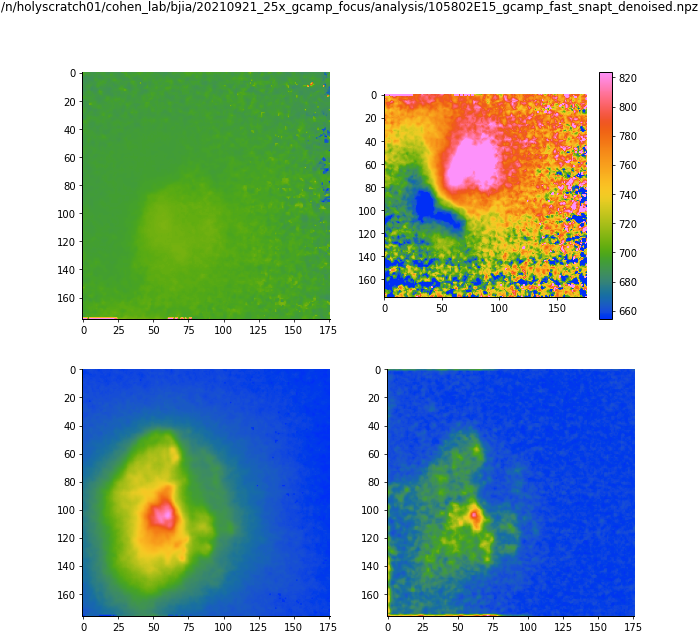

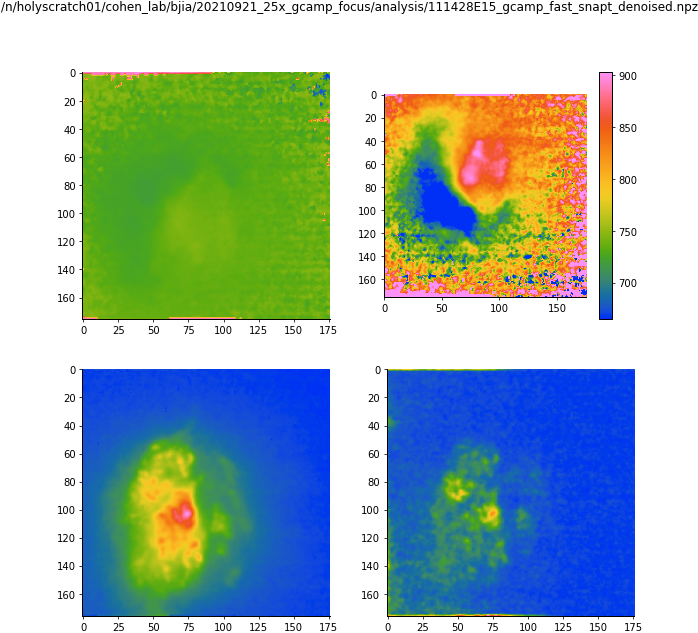

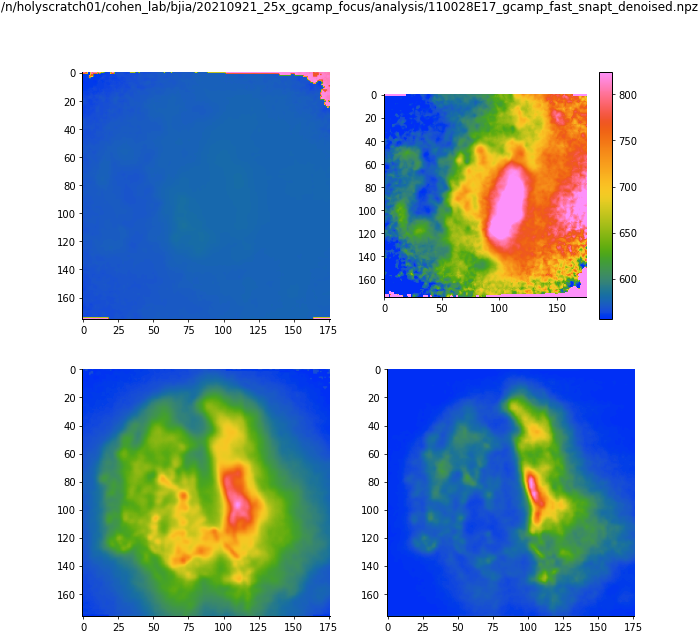

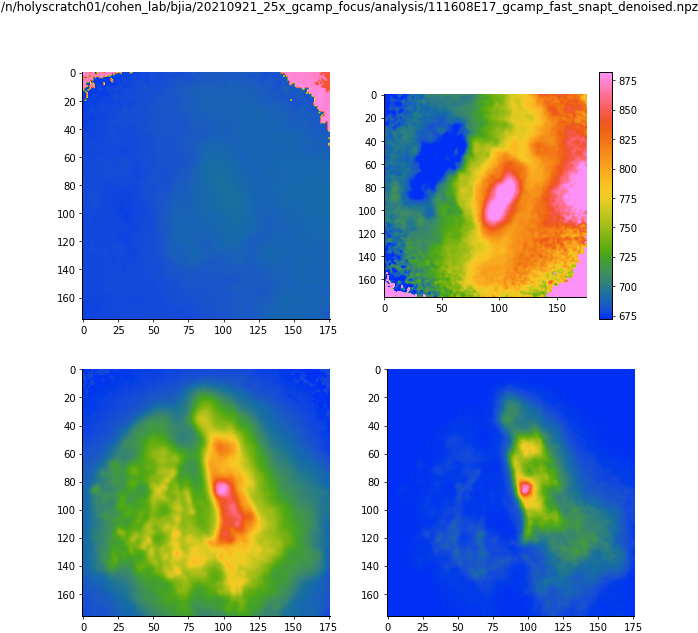

In [25]:
%matplotlib inline
plt.close('all')

for e in files_by_embryo.keys():
    timepoints = files_by_embryo[e]
    mask_idx = 0
    for t in timepoints:
        print(t)
        beta = np.load(os.path.join(rootdir, "analysis", t))["beta"]
        try:
            amplitude = beta[2,:,:]
        except Exception as err:
            print(err)
            continue
#         amplitude[np.isnan(amplitude)] = 0
#         mask = masks_by_embryo[e][mask_idx]
        hm_time = beta[1,:,:]*dt*1000
#         hm_time[~mask] = np.nan
        fig1, axes = plt.subplots(2,2,figsize=(10,10))
        axes = axes.ravel()
        fig1.suptitle(t)

        try:
            for i, ax in enumerate(axes):
                if i == 1:
                    im = axes[1].imshow(np.flipud(hm_time), vmin=np.percentile(hm_time[~np.isnan(hm_time)],5), vmax=np.percentile(hm_time[~np.isnan(hm_time)],95))
                    plt.colorbar(im, ax=axes[1])
                else:
                    ax.imshow(beta[i,:,:])
        except Exception as err:
            continue
        mask_idx +=1
    

[Errno 2] No such file or directory: '/n/holyscratch01/cohen_lab/bjia/20210921_25x_gcamp_focus/analysis/100301E18_gcamp_fast_snapt_smoothed.npz'


<ipython-input-92-2d4f483e4eb0>:51: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig1, axes = plt.subplots(1,2, figsize=(12,6))


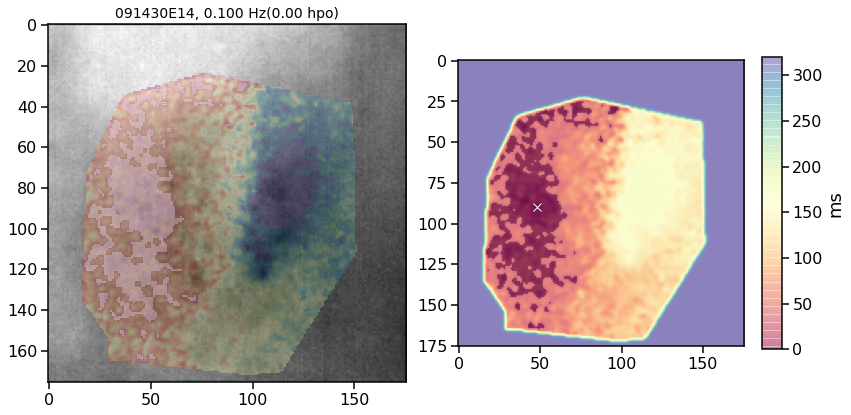

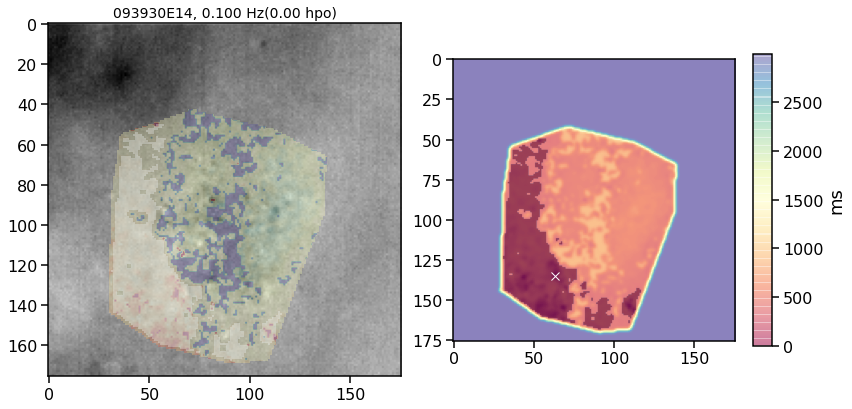

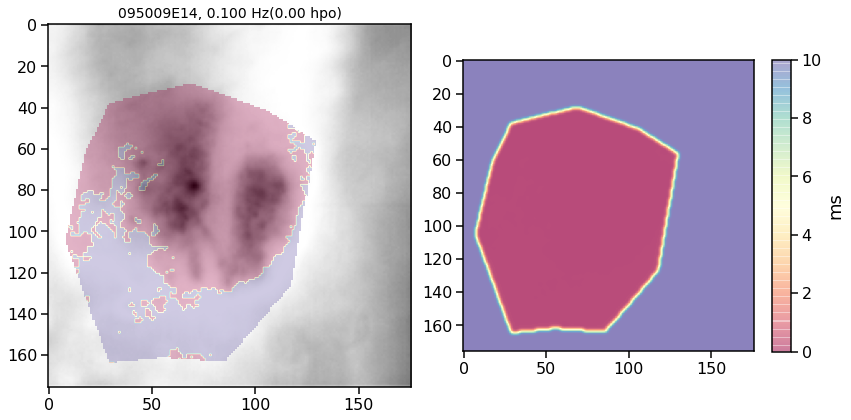

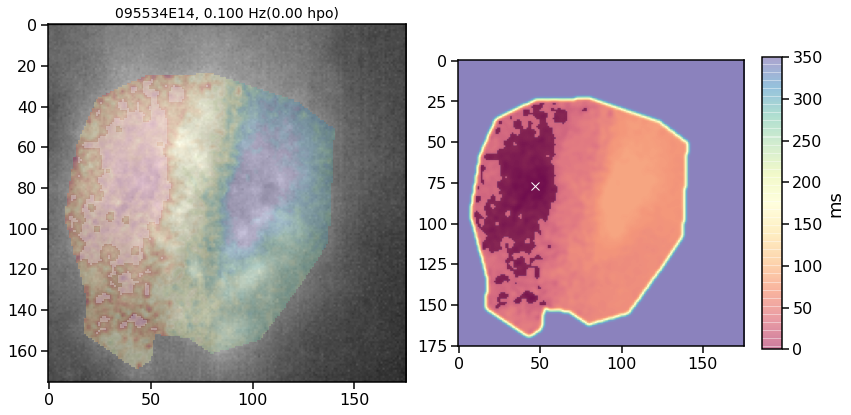

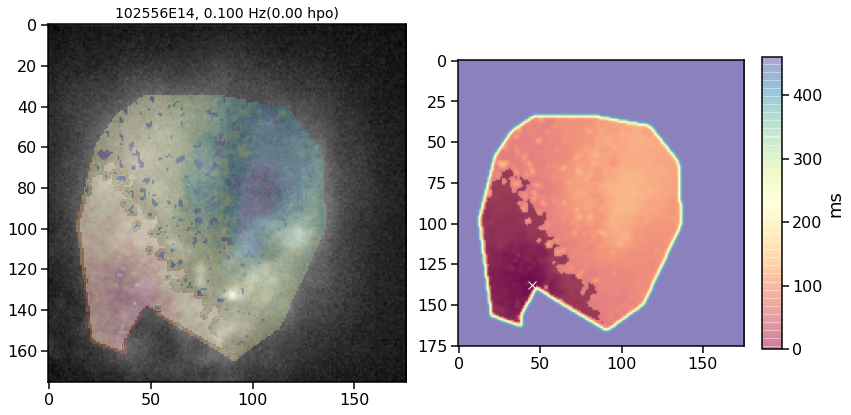

...

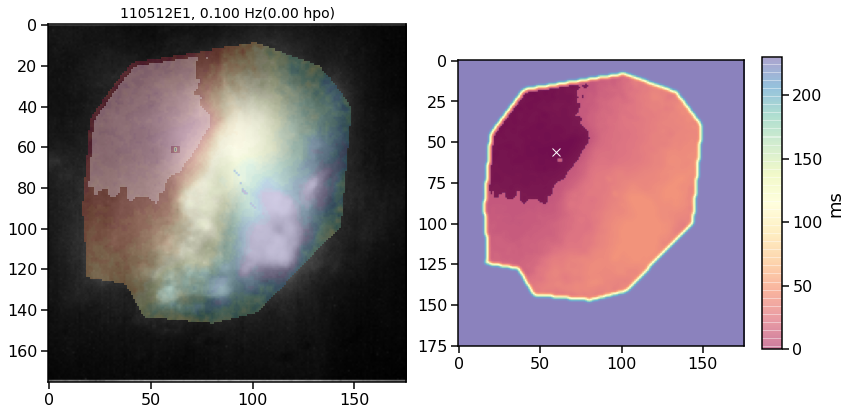

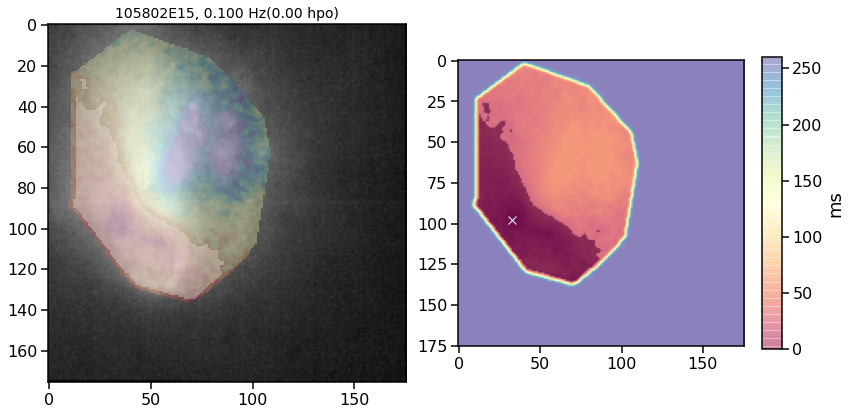

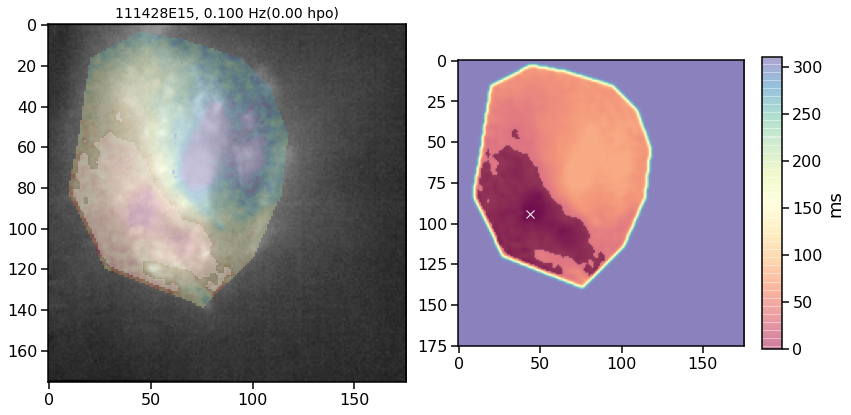

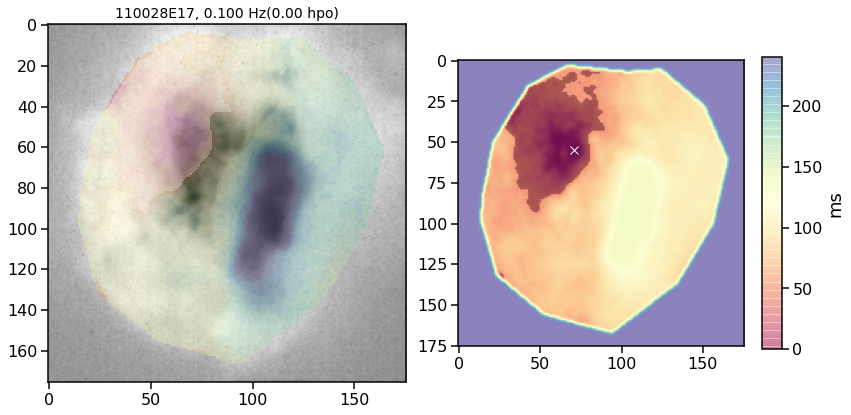

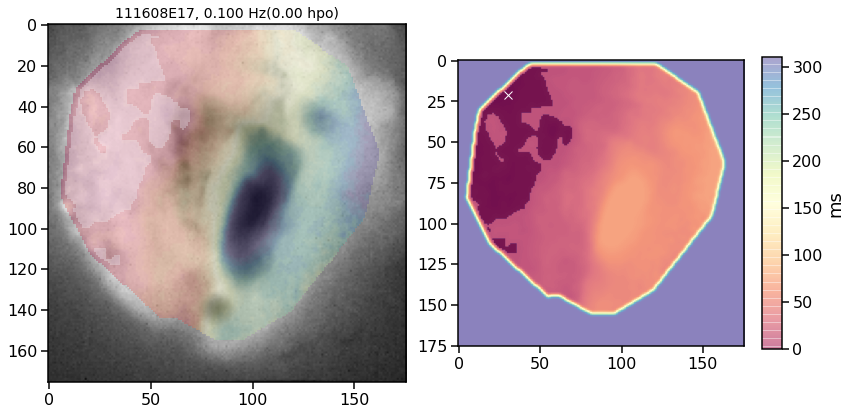

In [92]:
%matplotlib inline
plt.close('all')

for e in list(files_by_embryo.keys()):
    timepoints = files_by_embryo[e]
    mask_idx = 0
    for t in timepoints:
        try:
            beta = np.load(t.replace("snapt.npz", "snapt_smoothed.npz"))["beta"]
            pca_morphology = skio.imread(t.replace("_snapt.npz", "/pca.tif"))
            
            amplitude = beta[2,:,:]
        except Exception as err:
            print(err)
            continue
        amplitude[np.isnan(amplitude)] = 0
        mask = masks_by_embryo[e][mask_idx]
        hm_time = beta[1,:,:]/fs
        hm_time_old = np.copy(hm_time)
        hm_time[~mask] = np.nan
        
        pmin, pmax = np.percentile(hm_time[~np.isnan(hm_time)],[0.5, 95])
        hm_time[hm_time < pmin] = pmin
        hm_time[hm_time > pmax] = pmax
        hm_time = hm_time-np.min(hm_time[~np.isnan(hm_time)])
        
        hm_time_smoothed = np.copy(hm_time)
        hm_time_smoothed[np.isnan(hm_time_smoothed)] = pmax
        hm_time_smoothed = np.flipud(ndimage.gaussian_filter(hm_time_smoothed, 1))
        try:
            focus_mask = hm_time_smoothed < np.percentile(hm_time_smoothed, 10)
            labels, num = label(focus_mask, return_num=True)
            region_sizes = [np.sum(1/(hm_time_smoothed[labels==i]+0.01)) for i in np.arange(1, num+1)]
            single_region_mask = labels == (np.argmax(region_sizes)+1)
            masked_hm_time = np.ma.masked_array(hm_time_smoothed, ~single_region_mask)
            min_index = np.unravel_index(np.ma.argmin(masked_hm_time), hm_time.shape)
        except Exception:
            min_index = [np.nan, np.nan]
        
#         hm_time_nonan = np.copy(hm_time)
#         hm_time_nonan[np.isnan(hm_time)] = pmax
#         x, y = np.meshgrid(np.arange(hm_time.shape[0]), np.arange(hm_time.shape[0]))
#         x = x.ravel()
#         y = y.ravel()
#         spl = interpolate.SmoothBivariateSpline(x,y,hm_time_nonan.ravel(), s = 0.005)
#         hm_time_interp = spl.ev(x,y).reshape(hm_time_nonan.shape)
        
        
#         gx, gy = np.gradient(hm_time)
#         grd = np.sqrt(gx**2 + gy**2)
        fig1, axes = plt.subplots(1,2, figsize=(12,6))
        axes = axes.ravel()
        axes[0].imshow(np.flipud(pca_morphology), cmap="gray")
#         im = axes.contour(np.flipud(hm_time)*1000)
        im = axes[0].imshow(np.flipud(hm_time)*1000, alpha=0.3)
        axes[0].imshow(np.ma.masked_array(focus_mask, ~focus_mask), alpha=0.3, cmap="Blues")
        plt.colorbar(im, label="ms", aspect=15, shrink=0.75)
#         freq = n_peaks_by_embryo[e][mask_idx]/30
        freq = 0.1
        hpo = 0
        axes[0].set_title("%s, %.3f Hz(%.2f hpo)" %(os.path.basename(t).replace("_gcamp_fast_snapt.npz", ""), freq, hpo), fontsize=14)

        axes[1].imshow(hm_time_smoothed)
#         im = axes.contour(np.flipud(hm_time)*1000)
        axes[1].imshow(focus_mask, alpha=0.3, cmap="Blues")
        axes[1].plot(min_index[1], min_index[0], "wx")
#         mi2 = np.unravel_index(np.argmin(hm_time_smoothed), hm_time_smoothed.shape)
#         axes[1].plot(mi2[1], mi2[0], "kx")
    
        control_points_by_embryo[e][mask_idx].append([min_index[1], min_index[0]])
        plt.tight_layout()
        mask_idx +=1

In [93]:
f = open(os.path.join(rootdir, "analysis", "control_points_with_focus.pickle"), "wb")
pickle.dump(control_points_by_embryo, f)
f.close()